In [1]:
%load_ext autoreload
%autoreload 2

In [3]:
import os, sys
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import colormaps
from matplotlib.patches import Rectangle
import scipy.optimize as opt
from tqdm import tqdm
from matplotlib.colors import ListedColormap
from skimage import exposure
import xarray as xr


sys.path.append('../src/')
import data_utils as du
import vis_utils as vu
import analysis_utils as au


In [ ]:

# ### LOAD DATA ###
# ROTATION_CONTROL = False

# # Then collect from all patches the alpha and dyn data
# patches = 200
# hypotheses = []
# features = []
# pictures = []
# for p in tqdm(range(patches)):
#     # print(f'Loading patch {p} / {patches}')
#     # Load all data, both features and hypotheses, for the current patch
#     (data_sent, data_alpha, data_dyn, data_worldclim, data_dsm) = du.load_all_modalities_from_name(name=f'pecl176-{p}', 
#                                                                         path_folder='/Users/tplas/data/2025-10 neureo/pecl-100-subsample-30km', verbose=0)    
#     if data_sent is None:
#         continue
#     # Land coverage and DSM serve as hypotheses
#     assert len(data_dyn.data.shape) == 3 and len(data_dsm.data.shape) == 3 and data_dyn.data.shape[1:] == data_dsm.data.shape[1:]
    
#     hyp_tmp = np.concatenate([data_dyn.data, data_dsm.data], axis=0)
#     if ROTATION_CONTROL:
#         hyp_tmp = np.rot90(hyp_tmp, k=1, axes=(1, 2))  # rotate counter-clockwise 90 degrees
#     hypotheses.append(hyp_tmp)
#     # This can definitely be cleaner but I use nan for undefined values
#     f_dat = data_alpha.data
#     f_dat[~np.isfinite(f_dat)] = np.nan
    
#     if ROTATION_CONTROL:
#         f_dat = np.rot90(f_dat, k=1, axes=(1, 2))  # rotate counter-clockwise 90 degrees

#     features.append(f_dat)    
#     pictures.append(data_sent)
# # Some patches were undefined so set number to correct value
# patches = len(features)

# # Z-score across patches for each feature and each hypothesis
# feat_m = np.stack([np.nanmean(f) for f in np.stack(features, axis=-1)])
# feat_std = np.stack([np.nanstd(f) for f in np.stack(features, axis=-1)])
# features = [(f - feat_m[:,None,None])/feat_std[:,None,None] for f in features]
# hyp_m = np.stack([np.nanmean(h) for h in np.stack(hypotheses, axis=-1)])
# hyp_std = np.stack([np.nanstd(h) for h in np.stack(hypotheses, axis=-1)])
# hypotheses = [(h - hyp_m[:,None,None])/hyp_std[:,None,None] for h in hypotheses]

# # Get names of hypotheses: different coarse land coverage classes
# names = [k for k in du.create_cmap_dynamic_world().keys()] + ['dsm']

# # Extract relevant dimensions
# # radius = 5 # pixels, excluding center pixel (so diameter = 2 * radius + 1)
# N_features = features[0].shape[0]
# N_pixels = features[0].shape[1]
# N_hypotheses = hypotheses[0].shape[0]


# ## equalize histogram across patches for better visualization
# sentinel_eq = np.stack(pictures, -1)
# # sentinel_eq.shape
# sentinel_eq = sentinel_eq[:3, ...]
# # sentinel_eq = np.swapaxes(np.swapaxes(sentinel_eq, 1, 3), 1, 2)
# sentinel_eq = sentinel_eq.reshape([3, sentinel_eq.shape[1], -1])
# # # sentinel_eq = np.clip(sentinel_eq, 0, 3000) / 3000
# sentinel_eq = exposure.equalize_hist(sentinel_eq)
# sentinel_eq = sentinel_eq.reshape([3, sentinel_eq.shape[1], sentinel_eq.shape[1], -1])
# sentinel_eq = [sentinel_eq[:, :, :, i] for i in range(sentinel_eq.shape[-1])]


100%|██████████| 200/200 [00:01<00:00, 111.19it/s]


In [14]:
sentinel, sentinel_eq, features, hypotheses = du.load_all_data(zscore_features=True, 
                                        zscore_hypotheses=True, equalize_sentinel=True)
N_features = features[0].shape[0]
N_pixels = features[0].shape[1]
N_hypotheses = hypotheses[0].shape[0]
patches = len(features)

100%|██████████| 500/500 [00:02<00:00, 246.61it/s]


In [11]:

### LOAD OR RUN ANALYSIS ###
save_results = False 
base_dir = '../outputs/radius10'
# Load stas and fits, or recalculate them
load = True
if load:
    all_stas, all_fits, all_params, radius = au.load_tuning_surfaces(base_dir=base_dir)
else:
    all_stas, all_fits, all_params, radius = au.calculate_tuning_surfaces(hypotheses=hypotheses,
                                                                          features=features, radius=10,
                                                                          save_results=False)
plot_params, param_names, param_bins, filtered_params, sta_to_plot = au.adjust_fit_parameters_for_plotting(all_params, radius)
names = du.get_hyp_names()

In [9]:
all_stas.max()

np.float64(715.9993368461775)

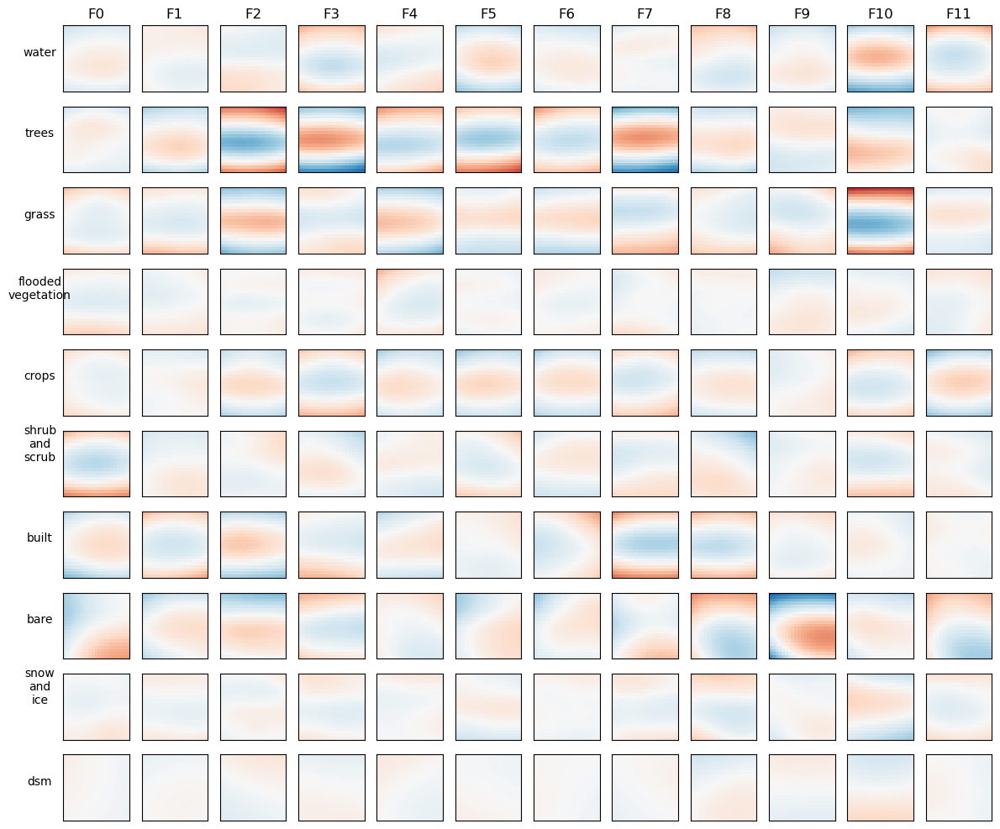

In [12]:
### PLOT RESULTS ###

# Plot a selection of stas
h_to_plot = len(all_stas)
f_to_plot = 12 # N_features
plt.figure(figsize=(f_to_plot, h_to_plot))
# Color plot borders by average value
# lim = np.nanmax(np.abs(all_stas[:h_to_plot, :f_to_plot]))
# Plot one tuning curve per hypothesis per feature
for row, hyp_stas in enumerate(all_stas[:h_to_plot]):
    for col, sta in enumerate(hyp_stas[:f_to_plot]):
        ax = plt.subplot(h_to_plot, f_to_plot, row * f_to_plot + col + 1)
        vu.plot_sta(sta, ax=ax)
        if col == 0:
            ax.set_ylabel(names[row].replace('_','\n'), rotation=0, labelpad=20)
        if row == 0:
            ax.set_title(f'F{col}')
plt.tight_layout();
if not load and save_results:
    plt.savefig(os.path.join(base_dir, 'sta_dat.png'))
 

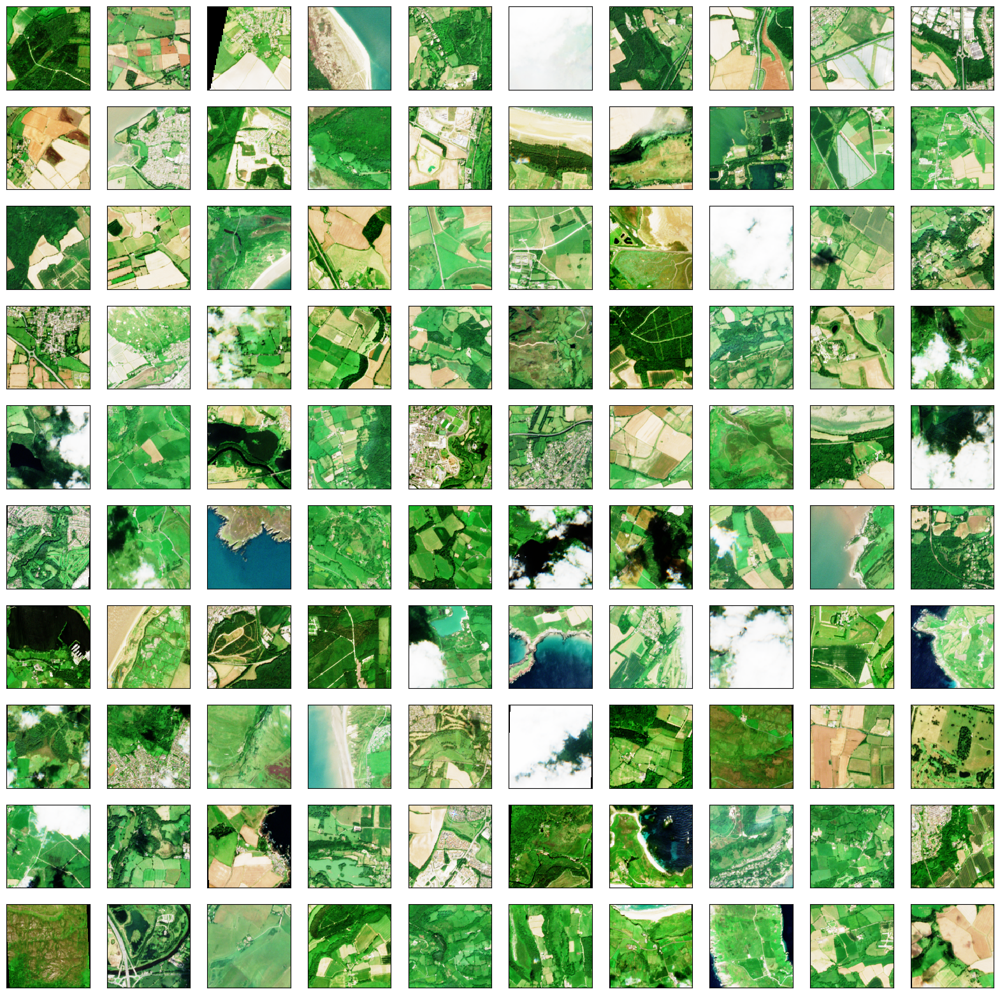

In [16]:
 # Plot the map for a particular feature that you might like across patches
cols=10
rows=int(np.ceil(patches/cols))
curr_f = 0
lim = np.nanmax(np.abs(np.stack(features, axis=-1)[curr_f]))
plt.figure(figsize=(2*cols, 2*rows))
for p, feature in enumerate(features):
    ax = plt.subplot(rows, cols, p + 1)
    vu.plot_sentinel(sentinel_eq[p], ax=ax)

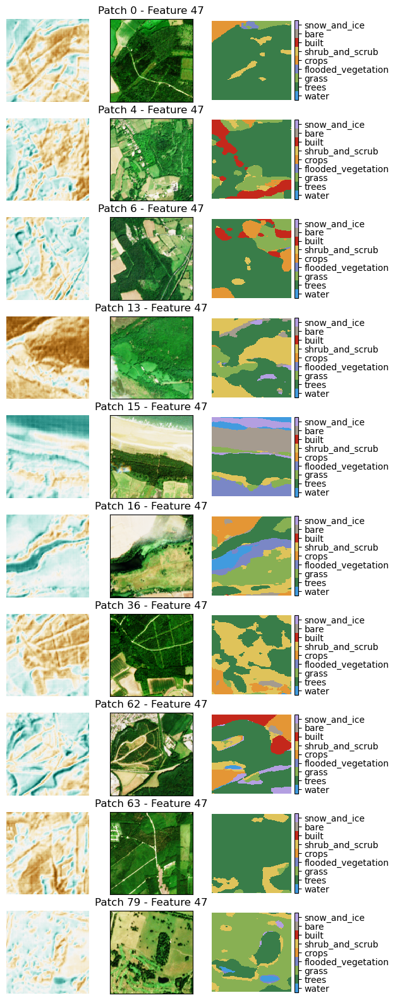

In [ ]:
 # Plot the map for a particular feature that you might like across patches
cols = 3
patch_list = [0, 4, 6, 13, 15, 16, 36, 62, 63, 79]
rows=len(patch_list)
curr_f = 47
fig, ax = plt.subplots(nrows=rows, ncols=cols,  figsize=(2*cols, 2*rows))
iplot = 0
for p in patch_list:
    feature = features[p]
    vu.plot_feature(feature[curr_f], ax=ax[iplot,0])
    vu.plot_sentinel(sentinel_eq[p], ax=ax[iplot,1])
    vu.plot_dw_landcover_from_hyp(hypotheses[p], fig=fig, ax=ax[iplot,2])
    ax[iplot, 1].set_title(f'Patch {p} - Feature {curr_f}')
    iplot += 1

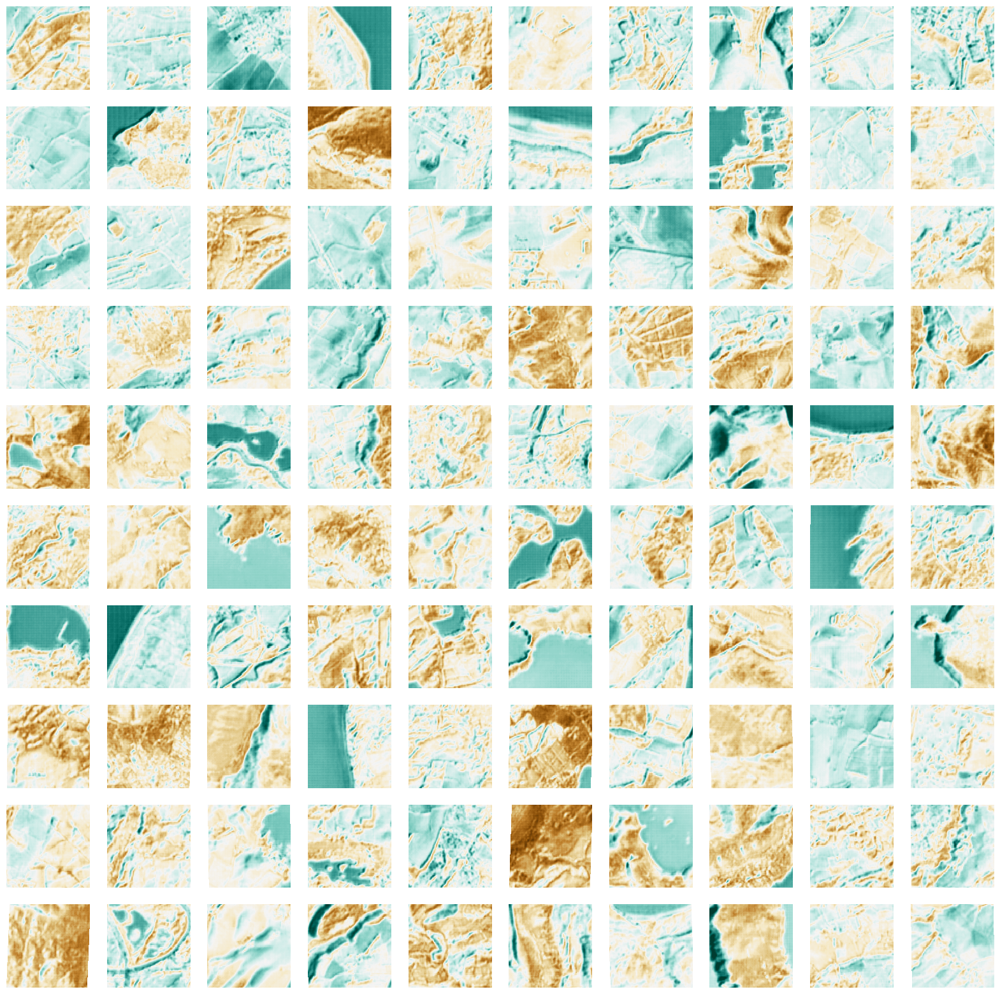

In [18]:
 # Plot the map for a particular feature that you might like across patches
curr_f = 47

cols=10
rows=int(np.ceil(patches/cols))
lim = np.nanmax(np.abs(np.stack(features, axis=-1)[curr_f]))
plt.figure(figsize=(2*cols, 2*rows))
for p, feature in enumerate(features):
    plt.subplot(rows, cols, p + 1)
    vu.plot_feature(feature[curr_f])    

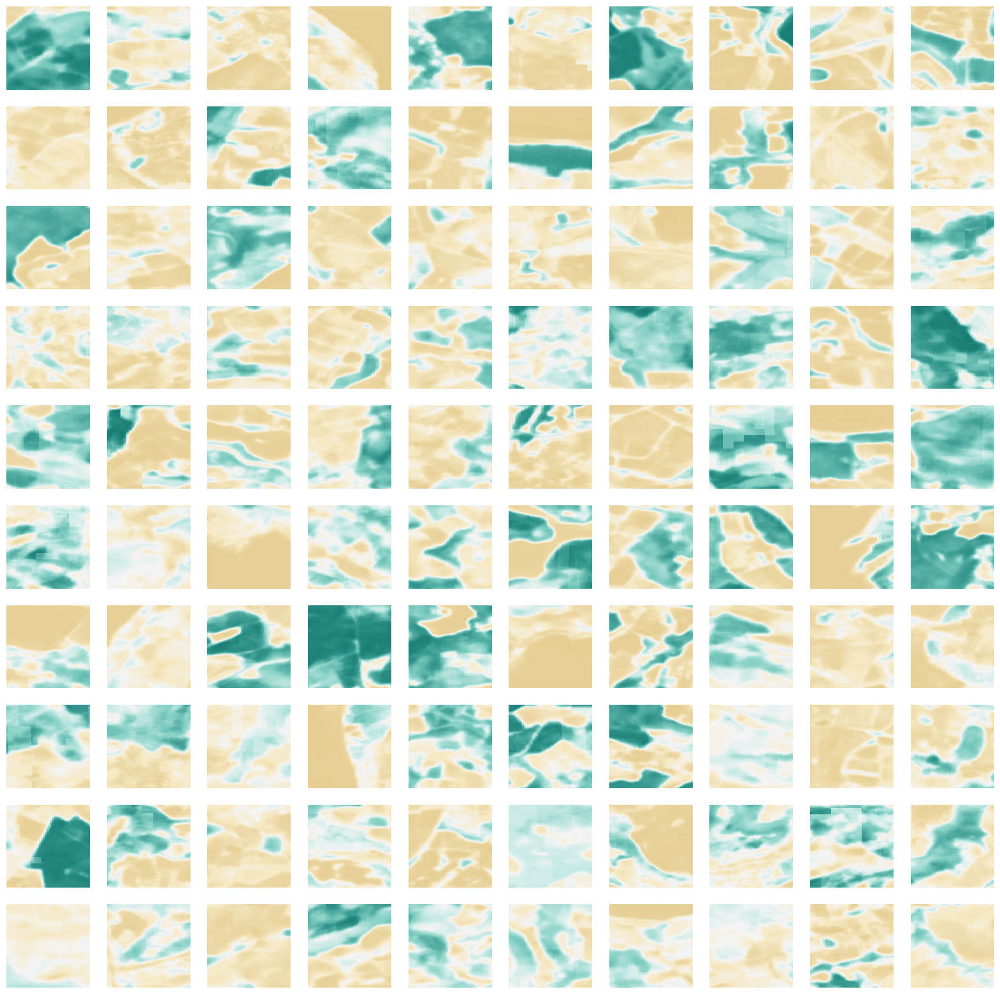

In [19]:
# Plot the map for a particular hypothesis that you might like across patches
curr_h = 1

cols=10
rows=int(np.ceil(patches/cols))

lim = np.nanmax(np.abs(np.stack(hypotheses, axis=-1)[curr_h]))
plt.figure(figsize=(2*cols, 2*rows))
for p, hypothesis in enumerate(hypotheses):
    plt.subplot(rows, cols, p + 1)   
    vu.plot_feature(hypothesis[curr_h])

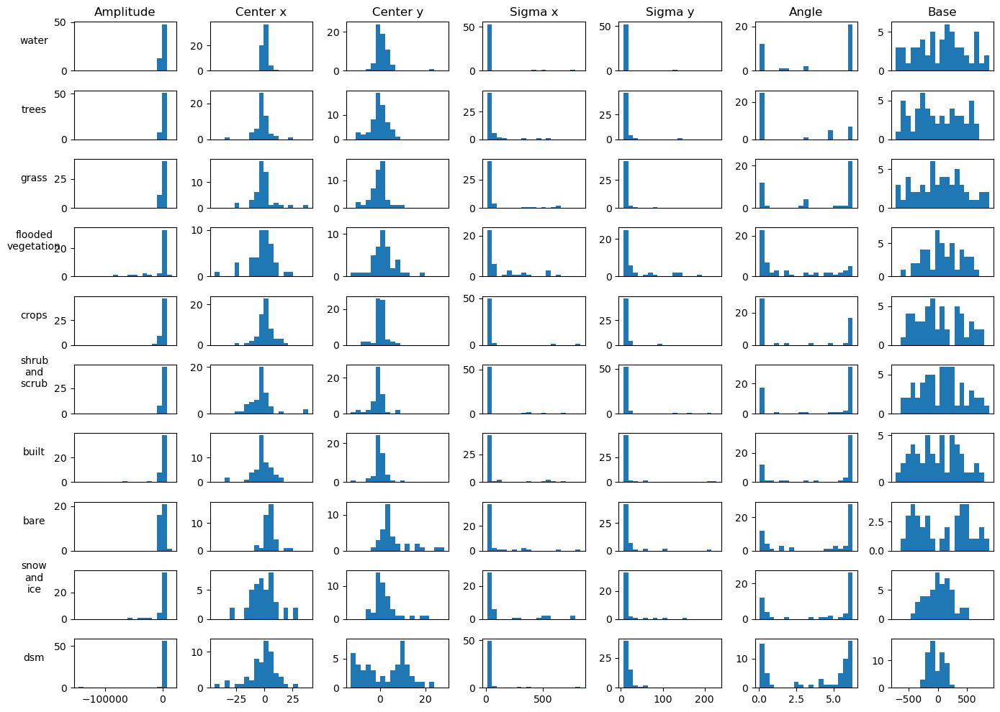

In [20]:
# Make overviews of all parameter histograms
plt.figure(figsize=(2*plot_params.shape[-1], plot_params.shape[0]))
for h, hyp_par in enumerate(plot_params):
    for p, (p_name, p_bins) in enumerate(zip(param_names, param_bins)):
        ax = plt.subplot(plot_params.shape[0], plot_params.shape[-1], h*plot_params.shape[-1] + p + 1)
        plt.hist(hyp_par[:,p], p_bins)
        if p == 0:
            ax.set_ylabel(names[h].replace('_','\n'), rotation=0, labelpad=20)
        if h == 0:
            ax.set_title(p_name)
        if h < plot_params.shape[0] - 1:
            ax.set_xticks([])
plt.tight_layout()
if not load:
    plt.savefig(os.path.join(base_dir, 'sta_par.png'))      

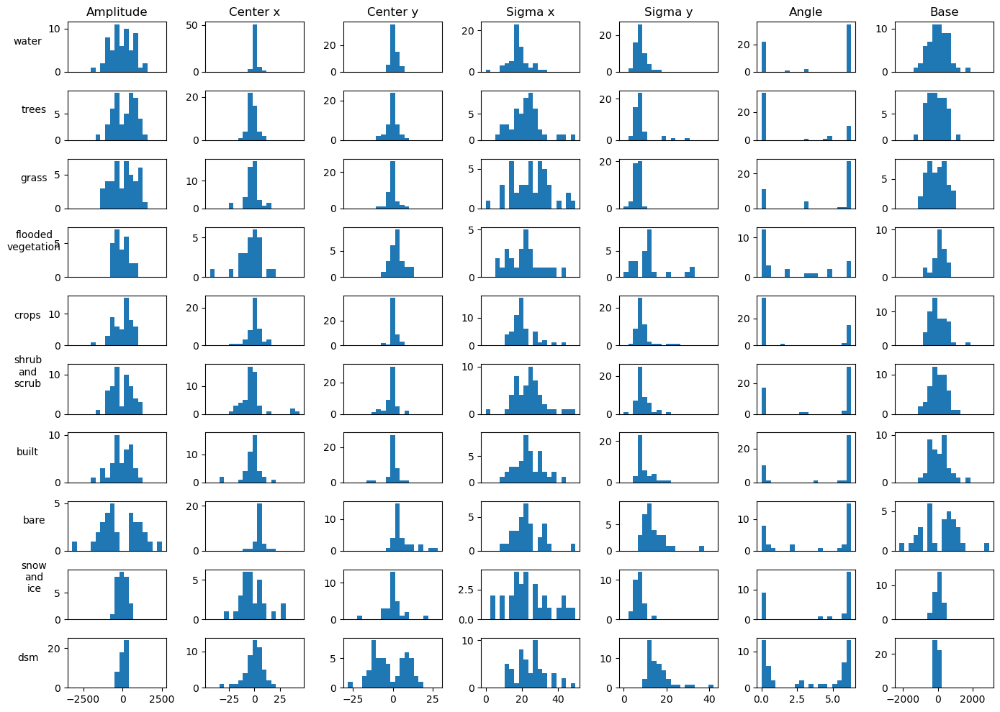

In [22]:

# Repeat for features with reasonable peak locations and sigmas
# This avoids fits where the sta is effectively a horizontal/vertical gradient
# so you need a huge gaussian (large radius, large amplitude, far away) to fit it

param_bins = [np.linspace(np.nanmin(filtered_params[:,:,p]), np.nanmax(filtered_params[:,:,p]), 20)
              for p in range(filtered_params.shape[-1])]
plt.figure(figsize=(2*plot_params.shape[-1], plot_params.shape[0]))
for h, hyp_par in enumerate(filtered_params):
    for p, (p_name, p_bins) in enumerate(zip(param_names, param_bins)):
        ax = plt.subplot(plot_params.shape[0], plot_params.shape[-1], h*plot_params.shape[-1] + p + 1)
        plt.hist(hyp_par[:,p], p_bins)
        if p == 0:
            ax.set_ylabel(names[h].replace('_','\n'), rotation=0, labelpad=20)
        if h == 0:
            ax.set_title(p_name)
        if h < plot_params.shape[0] - 1:
            ax.set_xticks([])
plt.tight_layout() 

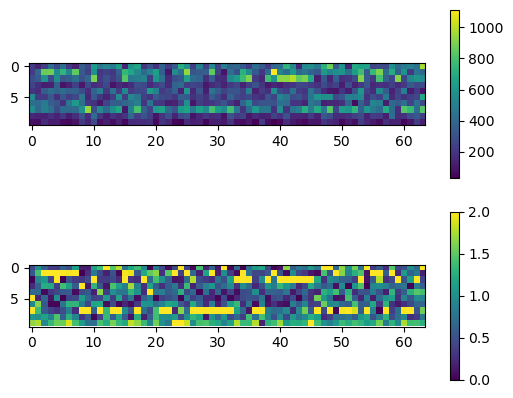

In [23]:

# Calculate tuning strength to each hypothesis for each feature
# It's a pretty rough estimate of tuning: 
# How many stds is one hyp's amplitude from the mean of other hyp amplitudes
tuning_strength = np.zeros((N_hypotheses, N_features))
amp_feat = np.max(all_stas.reshape([N_hypotheses, N_features, -1]), axis=-1) - np.min(all_stas.reshape([N_hypotheses, N_features, -1]), axis=-1)
for h in range(N_hypotheses):
    hyp_self = np.eye(N_hypotheses)[h].astype(np.bool)
    self_amp = amp_feat[h]
    other_mean = np.nanmean(amp_feat[~hyp_self], axis=0)
    other_std = np.nanstd(amp_feat[~hyp_self], axis=0)
    tuning_strength[h,:] = np.abs(self_amp - other_mean) / other_std
# Plot average response and significant tuning
plt.figure()
plt.subplot(2,1,1);
plt.imshow(amp_feat)
plt.colorbar()
plt.subplot(2,1,2);
plt.imshow(tuning_strength, vmin=0, vmax=2)
plt.colorbar()

Text(0.5, 1.0, 'F8 map')

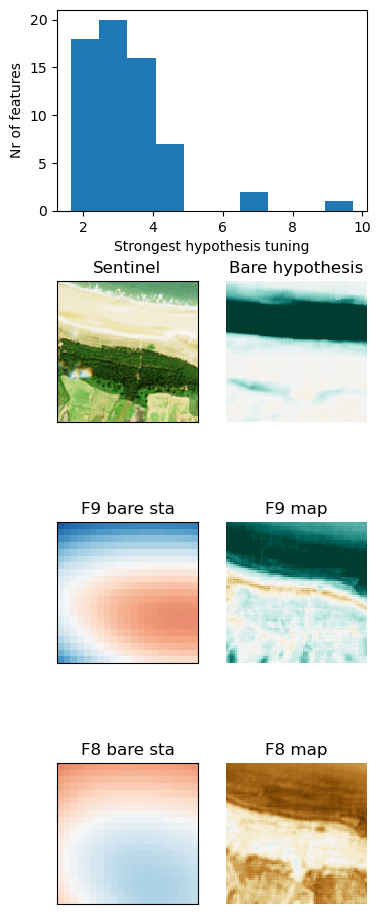

In [24]:
feat1, feat2 = 9, 8

# Plot distribution of strongest tuning across features
sta_lim = np.nanmax(np.abs(all_stas))
feat_lim = np.nanmax(np.abs(all_stas))
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(np.max(tuning_strength, axis=0));
plt.xlabel('Strongest hypothesis tuning')
plt.ylabel('Nr of features')

# Plot a strongly tuned example
ax = plt.subplot(4,2,3);
vu.plot_sentinel(sentinel_eq[15], ax=ax)
plt.title('Sentinel')

ax =plt.subplot(4,2,4);
vu.plot_feature(hypotheses[15][7], ax=ax)
plt.title('Bare hypothesis')

# Plot the feature that shows strong bare tuning
ax = plt.subplot(4,2,5)
vu.plot_sta(all_stas[7,feat1], ax=ax)
plt.title(f'F{feat1} bare sta')

ax = plt.subplot(4,2,6)
vu.plot_feature(features[15][feat1], ax=ax)
plt.title(f'F{feat1} map')

# Plot the feature that shows weak bare tuning
ax = plt.subplot(4,2,7)
vu.plot_sta(all_stas[7,feat2], ax=ax)
plt.title(f'F{feat2} bare sta')

ax = plt.subplot(4,2,8)
vu.plot_feature(features[15][feat2], ax=ax)
plt.title(f'F{feat2} map')

Text(0.5, 1.0, 'F62 map')

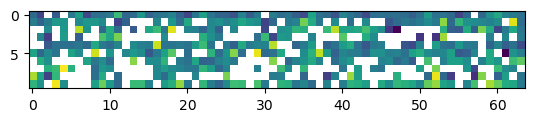

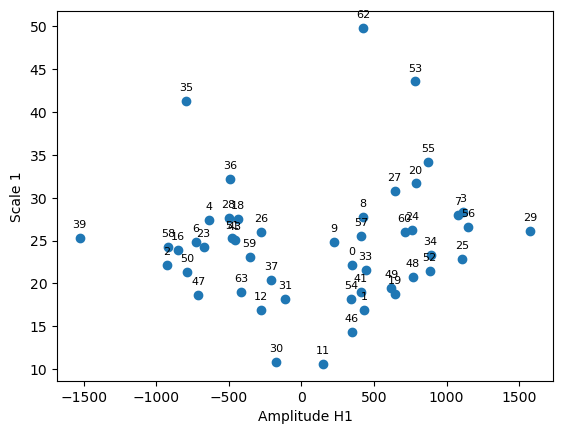

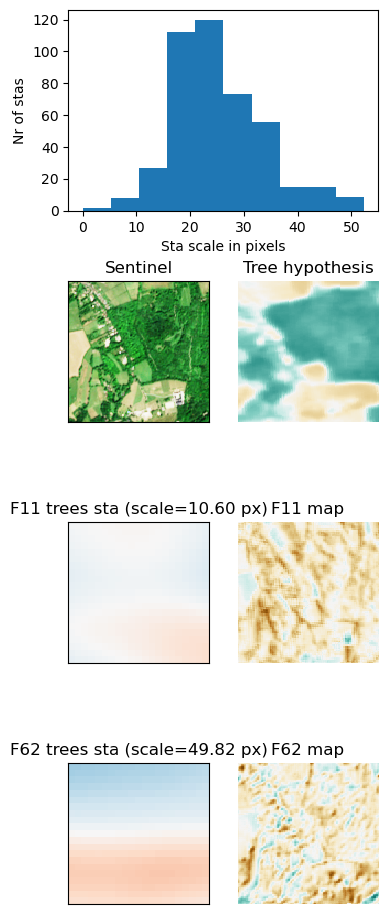

In [25]:
feat1, feat2 = 11, 62
ind_h = 1
ind_patch = 4
# Calculate scale: average between x and y sigma, only from reasonable fits
# scale = np.mean(filtered_params[:,:,3:5], axis=-1)
scale = np.sqrt(filtered_params[:,:,3] ** 2 + filtered_params[:,:,4] ** 2)
plt.figure()
plt.imshow(scale)

plt.figure()
ampl_h = filtered_params[ind_h, ...][:, 0]
scale_h = scale[ind_h, ...]

# plot points (skip nan)
valid = np.isfinite(ampl_h) & np.isfinite(scale_h)
plt.plot(ampl_h[valid], scale_h[valid], 'o')
plt.xlabel(f'Amplitude H{ind_h}')
# annotate each plotted point with its index above the marker
for i, (x, y) in enumerate(zip(ampl_h, scale_h)):
    if not (np.isfinite(x) and np.isfinite(y)):
        continue
    plt.annotate(str(i), xy=(x, y), xytext=(0, 6), textcoords='offset points',
                 ha='center', va='bottom', fontsize=8)
plt.ylabel(f'Scale {ind_h}')

# Plot scale across stas
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(scale[sta_to_plot]);
plt.xlabel('Sta scale in pixels')
plt.ylabel('Nr of stas')

# Plot a short and long scale example
ax = plt.subplot(4,2,3);
vu.plot_sentinel(sentinel_eq[ind_patch], ax=ax)
plt.title('Sentinel')

ax = plt.subplot(4,2,4);
vu.plot_feature(hypotheses[ind_patch][ind_h], ax=ax)
plt.title('Tree hypothesis')

# Plot the feature with short scale
ax = plt.subplot(4,2,5)
vu.plot_sta(all_stas[ind_h,feat1], ax=ax)
plt.title(f'F{feat1} trees sta (scale={scale[ind_h,feat1]:.2f} px)')

ax = plt.subplot(4,2,6);
vu.plot_feature(features[ind_patch][feat1], ax=ax)
plt.title(f'F{feat1} map')

# Plot the feature with long scale
ax = plt.subplot(4,2,7)
vu.plot_sta(all_stas[ind_h,feat2], ax=ax)
plt.title(f'F{feat2} trees sta (scale={scale[ind_h,feat2]:.2f} px)')

ax = plt.subplot(4,2,8);
vu.plot_feature(features[ind_patch][feat2], ax=ax)
plt.title(f'F{feat2} map')

Text(0.5, 1.0, 'F14 map')

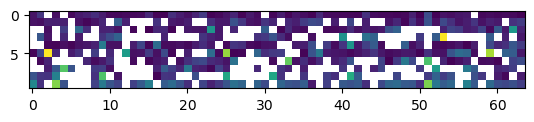

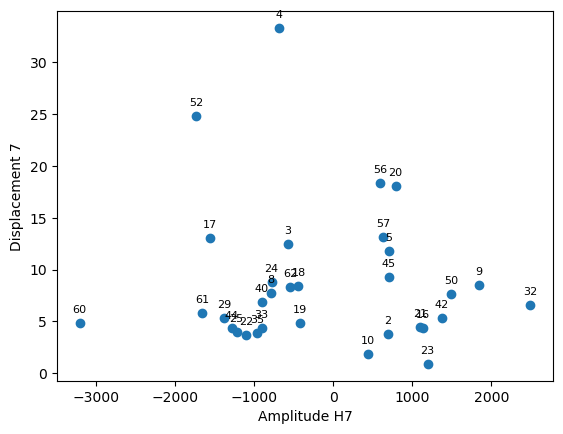

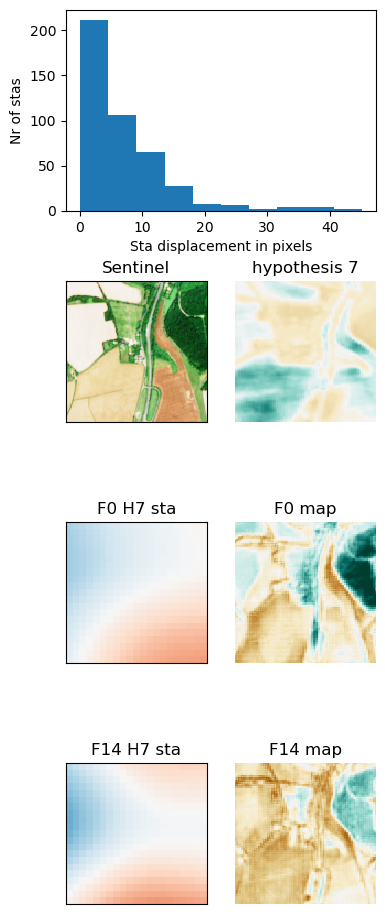

In [26]:
feat1, feat2 = 0, 14
ind_h = 7
ind_patch = 7

# Calculate displacement: peak to center distance
displacement = np.sqrt(filtered_params[:,:,1]**2 + filtered_params[:,:,2]**2)
plt.figure()
plt.imshow(displacement)

plt.figure()
ampl_h = filtered_params[ind_h, ...][:, 0]
displacement_h = displacement[ind_h, ...]

# plot points (skip nan)
valid = np.isfinite(ampl_h) & np.isfinite(displacement_h)
plt.plot(ampl_h[valid], displacement_h[valid], 'o')
plt.xlabel(f'Amplitude H{ind_h}')
# annotate each plotted point with its index above the marker
for i, (x, y) in enumerate(zip(ampl_h, displacement_h)):
    if not (np.isfinite(x) and np.isfinite(y)):
        continue
    plt.annotate(str(i), xy=(x, y), xytext=(0, 6), textcoords='offset points',
                 ha='center', va='bottom', fontsize=8)
plt.ylabel(f'Displacement {ind_h}')

# Plot displacement across stas
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(displacement[sta_to_plot]);
plt.xlabel('Sta displacement in pixels')
plt.ylabel('Nr of stas')

# Plot a short and long scale example
ax = plt.subplot(4,2,3);
vu.plot_sentinel(sentinel_eq[ind_patch], ax=ax)
plt.title('Sentinel')

ax = plt.subplot(4,2,4);
vu.plot_feature(hypotheses[ind_patch][ind_h], ax=ax)
plt.title(f'hypothesis {ind_h}')

# Plot the feature with small displacement
ax = plt.subplot(4,2,5)
vu.plot_sta(all_stas[ind_h,feat1], ax=ax)
plt.title(f'F{feat1} H{ind_h} sta')
ax = plt.subplot(4,2,6);
vu.plot_feature(features[ind_patch][feat1], ax=ax)
plt.title(f'F{feat1} map')
# Plot the feature with large displacement
ax = plt.subplot(4,2,7)
vu.plot_sta(all_stas[ind_h,feat2], ax=ax)
plt.title(f'F{feat2} H{ind_h} sta')

ax = plt.subplot(4,2,8);
vu.plot_feature(features[ind_patch][feat2], ax=ax)
plt.title(f'F{feat2} map')

/var/folders/kh/y9z_055x6gq8gc74b6y16r1c0000gn/T/ipykernel_90263/1895014686.py:8: RuntimeWarning: invalid value encountered in divide
  eccentricity = np.sqrt(1-(b/a)**2)


Text(0.5, 1.0, 'F49 map')

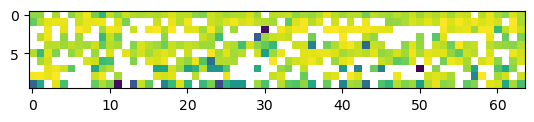

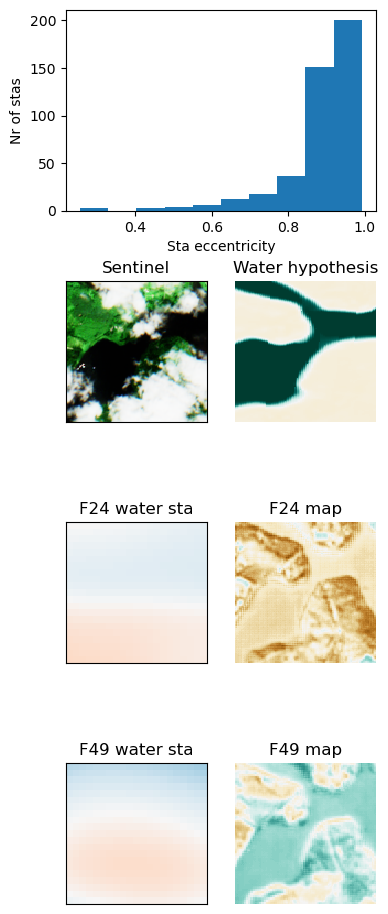

In [27]:
feat1, feat2 = 2, 21
ind_h = 0
ind_patch = 55

# Calculate symmetry: eccentricity
a = np.max(filtered_params[:,:,3:5], axis=-1)
b = np.min(filtered_params[:,:,3:5], axis=-1)
eccentricity = np.sqrt(1-(b/a)**2)
plt.figure()
plt.imshow(eccentricity)

# Plot eccentricity across stas
plt.figure(figsize=(4,12));
plt.subplot(4,1,1)
plt.hist(eccentricity[sta_to_plot]);
plt.xlabel('Sta eccentricity')
plt.ylabel('Nr of stas')
# Plot a short and long scale example
ax = plt.subplot(4,2,3);
vu.plot_sentinel(sentinel_eq[ind_patch], ax=ax)
plt.title('Sentinel')

ax = plt.subplot(4,2,4);
vu.plot_feature(hypotheses[ind_patch][ind_h], ax=ax)
plt.title('Water hypothesis')

# Plot the feature with small eccentricity
ax = plt.subplot(4,2,5)
vu.plot_sta(all_stas[ind_h,feat1], ax=ax)
plt.title('F24 water sta')

ax = plt.subplot(4,2,6);
vu.plot_feature(features[ind_patch][feat1], ax=ax)
plt.title('F24 map')

# Plot the feature with large eccentiricty
ax = plt.subplot(4,2,7)
vu.plot_sta(all_stas[ind_h,feat2], ax=ax)
plt.title('F49 water sta')

ax = plt.subplot(4,2,8);
vu.plot_feature(features[ind_patch][feat2], ax=ax)
plt.title('F49 map')

# Fig 2

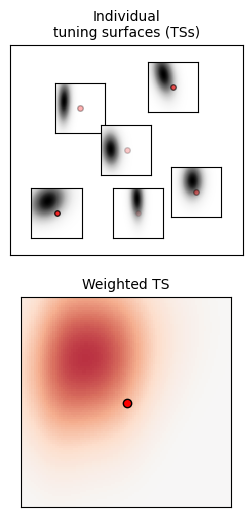

In [ ]:
vu.plot_sta_example()

/var/folders/kh/y9z_055x6gq8gc74b6y16r1c0000gn/T/ipykernel_90263/2845408593.py:60: RuntimeWarning: invalid value encountered in divide
  eccentricity = np.sqrt(1-(b/a)**2)


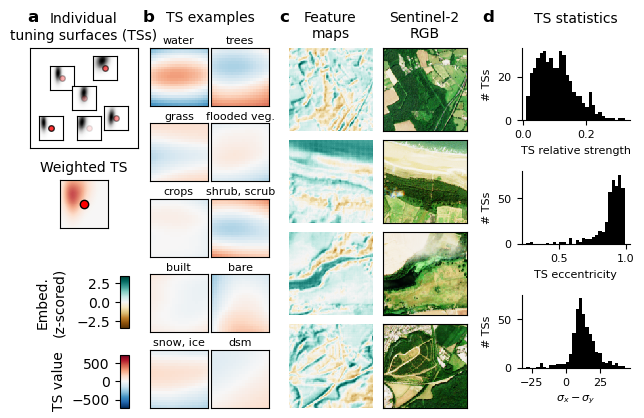

In [32]:
save_fig = False

patch_list = [6, 15, 16, 62] # [0, 4, 6, 13, 15, 16, 36, 62, 63, 79]
rows=len(patch_list)
curr_f = 47

fig = plt.figure(figsize=(6, 4))
gs_topleft = fig.add_gridspec(nrows=1, ncols=1, left=0.0, right=0.18, bottom=0.65, top=0.9)
ax_topleft = gs_topleft.subplots()
gs_middleleft = fig.add_gridspec(nrows=1, ncols=1, left=0.05, right=0.13, bottom=0.45, top=0.57)
ax_middleleft = gs_middleleft.subplots()
gs_cbar_bottomleft = fig.add_gridspec(nrows=2, ncols=1, left=0.15, right=0.165, bottom=0, top=0.33, hspace=0.5)
ax_cbar_bottomleft = gs_cbar_bottomleft.subplots()
gs_left = fig.add_gridspec(nrows=5, ncols=2, left=0.2, right=0.4, bottom=0, top=0.9, wspace=0.05, hspace=0.3)
ax_left = gs_left.subplots()
gs_middle = fig.add_gridspec(nrows=len(patch_list), ncols=2, left=0.43, right=0.73, bottom=0, top=0.9, wspace=0.1, hspace=0.1)
ax_middle = gs_middle.subplots()
gs_right = fig.add_gridspec(nrows=3, ncols=1, left=0.82, right=1, bottom=0.1, top=0.9, wspace=0.2, hspace=0.7)
ax_right = gs_right.subplots()

## Example
vu.plot_sta_example(ax_top=ax_topleft, ax_bottom=ax_middleleft)

## STAs:
ax_left = ax_left.flatten()
stas_feat = np.squeeze(all_stas[:, curr_f, :, :])
h_names = du.get_hyp_names()
h_names = [h.replace('flooded_vegetation', 'flooded veg.').replace('shrub_and_scrub', 'shrub, scrub').replace('snow_and_ice', 'snow, ice') for h in h_names]
for iplot, ax in enumerate(ax_left):
    vu.plot_sta(stas_feat[iplot], ax=ax, plot_cbar=(iplot==8), cax=ax_cbar_bottomleft[1] if iplot==8 else None)
    ax.set_title(f'{h_names[iplot].replace('_', ' ')}', fontsize=8, y=0.92)

## Example patches:
iplot = 0
for p in patch_list:
    feature = features[p]
    vu.plot_feature(feature[curr_f], ax=ax_middle[iplot][0], plot_cbar=(iplot==0), cax=ax_cbar_bottomleft[0])
    vu.plot_sentinel(sentinel_eq[p], ax=ax_middle[iplot][1])
    # plot_dw_landcover_from_hyp(hypotheses[p], ax=ax[iplot,2], plot_cbar=(iplot==0))
    # ax_middle[iplot, 1].set_title(f'Patch {p} - Feature {curr_f}')
    iplot += 1

## Statistics:
# Tuning strength histogram
ax = ax_right[0]
amp_feat = np.max(np.abs(all_stas.reshape([N_hypotheses, N_features, -1])), axis=-1)
amp_feat_rel = amp_feat / amp_feat.sum(axis=0, keepdims=True)
    
ax.hist(np.ravel(amp_feat_rel[sta_to_plot]), bins=30, color='k')
# ax.hist(np.max(tuning_strength, axis=0), bins=20, color='k')
ax.set_xlabel('TS relative strength', fontsize=8)
ax.set_ylabel('# TSs', fontsize=8)
ax.tick_params(axis='both', which='major', labelsize=8)
vu.despine(ax=ax)

## Eccentricity histogram
ax = ax_right[1]
a = np.max(filtered_params[:,:,3:5], axis=-1)
b = np.min(filtered_params[:,:,3:5], axis=-1)
eccentricity = np.sqrt(1-(b/a)**2)

ax.hist(eccentricity[sta_to_plot], bins=30, color='k')
ax.set_xlabel('TS eccentricity', fontsize=8)
ax.set_ylabel('# TSs', fontsize=8)
ax.tick_params(axis='both', which='major', labelsize=8)
vu.despine(ax=ax)

ax = ax_right[2]
ax.hist(np.ravel(filtered_params[:, :, 3] - filtered_params[:, :, 4]), bins=30, color='k')
ax.set_xlabel(r"$\sigma_x - \sigma_y$", fontsize=8)
ax.set_ylabel('# TSs', fontsize=8)
ax.tick_params(axis='both', which='major', labelsize=8)
vu.despine(ax=ax)


sys.path.append('/Users/tplas/repos/reproducible_figures/scripts')
import rep_fig_vis as rfv
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='a', x_offset=0.08, y_offset=0.23, fontsize=12)
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='b', x_offset=1.16, y_offset=0.23, fontsize=12)
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='c', x_offset=2.4, y_offset=0.23, fontsize=12)
rfv.add_panel_label(fig=fig, ax=ax_topleft, label_letter='d', x_offset=4.3, y_offset=0.23, fontsize=12)

ax_left[0].annotate('TS examples', xy=(1.05, 1.45), xycoords='axes fraction', ha='center', fontsize=10)
ax_middle[0][0].annotate('Feature\nmaps', xy=(0.5, 1.12), xycoords='axes fraction', ha='center', fontsize=10)
ax_middle[0][1].annotate('Sentinel-2\nRGB', xy=(0.5, 1.12), xycoords='axes fraction', ha='center', fontsize=10)
ax_right[0].annotate('TS statistics\n', xy=(0.5, 1.12), xycoords='axes fraction', ha='center', fontsize=10)

fig.align_ylabels(ax_cbar_bottomleft)
fig.align_ylabels(ax_right)

if save_fig:
    fig.savefig('../figs/fig2.pdf', bbox_inches='tight')
    plt.savefig('../../ms_neureo/figs/fig2.pdf', bbox_inches='tight')